# CIFAR10

## Recuperation des données

In [19]:
import matplotlib.pyplot as plt
import numpy as np
import os

import tensorflow as tf
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.models import Sequential, Model, save_model, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Input, GlobalAveragePooling2D, BatchNormalization, Dropout
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam

from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

# Chargement du dataset CIFAR-10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()


# Mapping des classes CIFAR-10 (en anglais)
class_names = ['Avion', 'Automobile', 'Oiseau', 'Chat', 'Cerf', 'Chien', 'Grenouille', 'Cheval', 'Bateau', 'Camion']

# Création d'un dictionnaire pour stocker une image de chaque classe
one_image_per_class = {}

## Affichage une image par classe

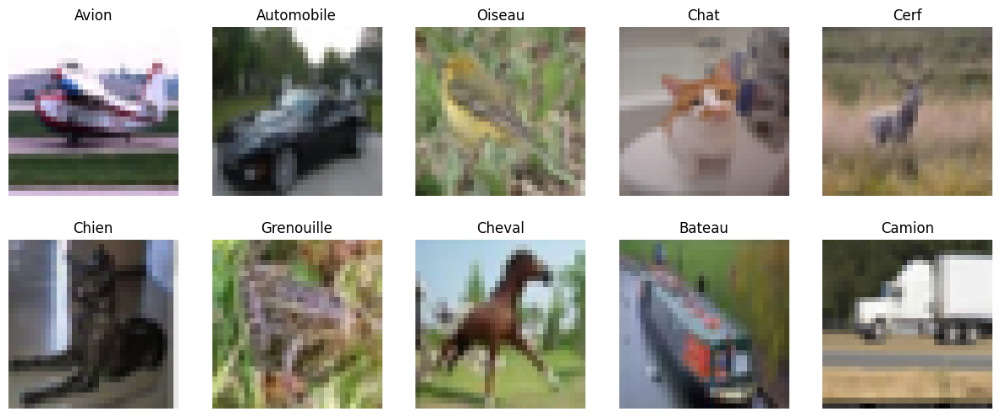

In [20]:
# Trouver une image aléatoire pour chaque classe
for i in range(10):
    indices = np.where(y_train == i)[0]
    random_index = np.random.choice(indices)
    one_image_per_class[i] = x_train[random_index]

# Affichage d'une image de chaque classe
plt.figure(figsize=(15, 6))

for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(one_image_per_class[i])
    plt.title(class_names[i])
    plt.axis('off')

plt.show()

## Pretraitement

In [21]:
# Prétraitement des données
x_train = x_train.astype('float32') / 255.0
x_test = x_test.astype('float32') / 255.0
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)


## Listes des models non pré entrainés

In [22]:
# Liste des architectures de modèles à tester avec leurs noms
models_to_test = [
    {
        'name': 'CNN simple',
        'model': Sequential([
            Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)),
            MaxPooling2D((2, 2)),
            Conv2D(64, (3, 3), activation='relu'),
            MaxPooling2D((2, 2)),
            Conv2D(64, (3, 3), activation='relu'),
            Flatten(),
            Dense(64, activation='relu'),
            Dense(10, activation='softmax')
        ])
    },
    # {
    #     'name': 'LeNet',
    #     'model': Sequential([
    #         Conv2D(6, (5, 5), activation='relu', input_shape=(32, 32, 3)),  # Modification ici pour 3 canaux
    #         MaxPooling2D((2, 2)),
    #         Conv2D(16, (5, 5), activation='relu'),
    #         MaxPooling2D((2, 2)),
    #         Flatten(),
    #         Dense(120, activation='relu'),
    #         Dense(84, activation='relu'),
    #         Dense(10, activation='softmax')
    #     ])
    # },
    # {
    #     'name': 'AlexNet',
    #     'model': Sequential([
    #         # Première couche de convolution
    #         Conv2D(96, (3, 3), activation='relu', input_shape=(32, 32, 3)),
    #         MaxPooling2D((2, 2)),
    #         BatchNormalization(),
            
    #         # Deuxième couche de convolution
    #         Conv2D(256, (3, 3), activation='relu', padding='same'),
    #         MaxPooling2D((2, 2)),
    #         BatchNormalization(),
            
    #         # Troisième couche de convolution
    #         Conv2D(384, (3, 3), activation='relu', padding='same'),
            
    #         # Quatrième couche de convolution
    #         Conv2D(384, (3, 3), activation='relu', padding='same'),
            
    #         # Cinquième couche de convolution
    #         Conv2D(256, (3, 3), activation='relu', padding='same'),
    #         MaxPooling2D((2, 2)),
    #         BatchNormalization(),
            
    #         # Couche complètement connectée
    #         Flatten(),
    #         Dense(4096, activation='relu'),
    #         Dropout(0.5),
            
    #         # Deuxième couche complètement connectée
    #         Dense(4096, activation='relu'),
    #         Dropout(0.5),
            
    #         # Couche de sortie
    #         Dense(10, activation='softmax')
    #     ])
    # },

    # {
    #     'name': 'VGGNet',
    #     'model': Sequential([
    #         # Bloc 1
    #         Conv2D(64, (3, 3), activation='relu', input_shape=(32, 32, 3), padding='same'),
    #         Conv2D(64, (3, 3), activation='relu', padding='same'),
    #         MaxPooling2D((2, 2), strides=(2, 2)),
            
    #         # Bloc 2
    #         Conv2D(128, (3, 3), activation='relu', padding='same'),
    #         Conv2D(128, (3, 3), activation='relu', padding='same'),
    #         MaxPooling2D((2, 2), strides=(2, 2)),
            
    #         # Bloc 3
    #         Conv2D(256, (3, 3), activation='relu', padding='same'),
    #         Conv2D(256, (3, 3), activation='relu', padding='same'),
    #         Conv2D(256, (3, 3), activation='relu', padding='same'),
    #         MaxPooling2D((2, 2), strides=(2, 2)),
            
    #         # Bloc 4
    #         Conv2D(512, (3, 3), activation='relu', padding='same'),
    #         Conv2D(512, (3, 3), activation='relu', padding='same'),
    #         Conv2D(512, (3, 3), activation='relu', padding='same'),
    #         MaxPooling2D((2, 2), strides=(2, 2)),
            
    #         # Bloc 5
    #         Conv2D(512, (3, 3), activation='relu', padding='same'),
    #         Conv2D(512, (3, 3), activation='relu', padding='same'),
    #         Conv2D(512, (3, 3), activation='relu', padding='same'),
    #         MaxPooling2D((2, 2), strides=(2, 2)),
            
    #         Flatten(),
    #         Dense(4096, activation='relu'),
    #         Dense(4096, activation='relu'),
    #         Dense(10, activation='softmax')
    #     ])
    # },
]


## Fonction de train

In [23]:
# Entraînement et évaluation des modèles
def train_evaluate_models(models_to_test, x_train, y_train, x_test, y_test):
    results = []

    for model_info in models_to_test:
        model = model_info['model']
        model_name = model_info['name']

        print(f"Entraînement du modèle {model_name}")
        
        model.compile(optimizer='adam',
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])
        history = model.fit(x_train, y_train, epochs=15, batch_size=32, validation_split=0.2)

        # Sauvegarde du modèle dans un fichier .h5
        model_save_path = os.path.join("../models/cifar10/", f"{model_name}.h5")
        save_model(model, model_save_path)

        test_loss, test_accuracy = model.evaluate(x_test, y_test, verbose=2)
        print(f"Accuracy du modèle {model_name} sur l'ensemble de test : {test_accuracy * 100:.2f}%")

        results.append({'model_name': model_name, 'model': model, 'accuracy': test_accuracy})

    best_model_info = max(results, key=lambda x: x['accuracy'])
    best_model = best_model_info['model']
    best_model_name = best_model_info['model_name']
    best_accuracy = best_model_info['accuracy']

    print(f"Le meilleur modèle est {best_model_name} avec une accuracy de {best_accuracy * 100:.2f}% sur l'ensemble de test.")


In [24]:
train_evaluate_models(models_to_test, x_train, y_train, x_test, y_test)

Entraînement du modèle CNN simple

Epoch 1/15
1250/1250 [==============================] - 8s 6ms/step - loss: 1.5635 - accuracy: 0.4256 - val_loss: 1.4020 - val_accuracy: 0.4958
Epoch 2/15
1250/1250 [==============================] - 6s 5ms/step - loss: 1.2355 - accuracy: 0.5572 - val_loss: 1.2249 - val_accuracy: 0.5690
Epoch 3/15
1250/1250 [==============================] - 6s 5ms/step - loss: 1.0818 - accuracy: 0.6190 - val_loss: 1.0372 - val_accuracy: 0.6337
Epoch 4/15
1250/1250 [==============================] - 6s 5ms/step - loss: 0.9750 - accuracy: 0.6570 - val_loss: 0.9784 - val_accuracy: 0.6541
Epoch 5/15
1250/1250 [==============================] - 6s 5ms/step - loss: 0.8935 - accuracy: 0.6854 - val_loss: 0.9501 - val_accuracy: 0.6713
Epoch 6/15
1250/1250 [==============================] - 8s 6ms/step - loss: 0.8239 - accuracy: 0.7105 - val_loss: 0.9199 - val_accuracy: 0.6805
Epoch 7/15
1250/1250 [==============================] - 6s 5ms/step - loss: 0.7800 - accuracy: 0.7287

C:\Users\yannv\AppData\Local\Temp\ipykernel_31256\1209704416.py:18: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  save_model(model, model_save_path)


313/313 - 1s - loss: 0.9505 - accuracy: 0.7009 - 526ms/epoch - 2ms/step
Accuracy du modèle CNN simple sur l'ensemble de test : 70.09%
Le meilleur modèle est CNN simple avec une accuracy de 70.09% sur l'ensemble de test.


## Fonction predict affichage

In [25]:


def display_random_images_with_predictions(x_test, y_test, class_names, model):
    num_images_per_class = 10
    plt.figure(figsize=(15, 15))
    
    correct_predictions = 0
    wrong_predictions = 0

    for class_idx, class_name in enumerate(class_names):
        # Sélectionne aléatoirement 10 indices des images de la classe actuelle
        class_indices = np.where(np.argmax(y_test, axis=1) == class_idx)[0]
        random_indices = np.random.choice(class_indices, num_images_per_class, replace=False)

        for i, idx in enumerate(random_indices):
            image = x_test[idx]
            true_label = class_name
            predicted_label = class_names[np.argmax(model.predict(np.expand_dims(image, axis=0), verbose=0))]  # Ajout de verbose=0 ici

            if true_label == predicted_label:
                color = 'green'
                correct_predictions += 1
            else:
                color = 'red'
                wrong_predictions += 1

            plt.subplot(10, num_images_per_class, class_idx * num_images_per_class + i + 1)
            plt.imshow(image)
            plt.title(f'True: {true_label}\nPredicted: {predicted_label}', color=color)
            plt.axis('off')

    plt.tight_layout()
    plt.show()
    
    print(f'Nombre de bonnes prédictions : {correct_predictions}')
    print(f'Nombre de mauvaises prédictions : {wrong_predictions}')


def evaluate_model(x_test, y_test, model, class_names):
    # Faites des prédictions sur l'ensemble du jeu de données de test
    predictions = model.predict(x_test)
    predicted_labels = [np.argmax(prediction) for prediction in predictions]
    true_labels = [np.argmax(label) for label in y_test]

    # Calculez l'accuracy globale
    accuracy = accuracy_score(true_labels, predicted_labels)
    print(f'Accuracy globale : {accuracy * 100:.2f}%')

    # Générez le rapport de classification
    classification_rep = classification_report(true_labels, predicted_labels, target_names=class_names)
    print(classification_rep)

    # Calculez l'accuracy par classe
    class_accuracies = {}
    for class_name in class_names:
        class_indices = [i for i, label in enumerate(true_labels) if class_names[label] == class_name]
        class_true_labels = [true_labels[i] for i in class_indices]
        class_predicted_labels = [predicted_labels[i] for i in class_indices]
        class_accuracy = accuracy_score(class_true_labels, class_predicted_labels)
        class_accuracies[class_name] = class_accuracy

    print("Accuracy par classe :")
    for class_name, class_accuracy in class_accuracies.items():
        print(f"{class_name}: {class_accuracy * 100:.2f}%")
    


# Modeles pré-entrainés

## DenseNet121

In [22]:
from tensorflow.keras.applications import DenseNet121

# Chargement du modèle DenseNet121 pré-entraîné
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(32, 32, 3))

# Ajout de couches personnalisées au modèle
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)  # Ajout de Dropout
x = Dense(512, activation='relu')(x)  # Ajout d'une autre couche Dense
x = Dropout(0.5)(x)  # Ajout de Dropout
predictions = Dense(10, activation='softmax')(x)  # 10 classes pour CIFAR-10


model = Model(inputs=base_model.input, outputs=predictions)

# Compilation du modèle
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
model.fit(x_train, y_train, epochs=5, batch_size=64, validation_split=0.2)

Epoch 1/5
625/625 [==============================] - 144s 205ms/step - loss: 1.6101 - accuracy: 0.4455 - val_loss: 0.8568 - val_accuracy: 0.7134
Epoch 2/5
625/625 [==============================] - 125s 200ms/step - loss: 0.8238 - accuracy: 0.7301 - val_loss: 0.6316 - val_accuracy: 0.7878
Epoch 3/5
625/625 [==============================] - 129s 207ms/step - loss: 0.5905 - accuracy: 0.8088 - val_loss: 0.5803 - val_accuracy: 0.8038
Epoch 4/5
625/625 [==============================] - 128s 204ms/step - loss: 0.4486 - accuracy: 0.8536 - val_loss: 0.5501 - val_accuracy: 0.8189
Epoch 5/5
625/625 [==============================] - 124s 199ms/step - loss: 0.3476 - accuracy: 0.8877 - val_loss: 0.5362 - val_accuracy: 0.8276


In [23]:
# Évaluation du modèle
test_loss, test_accuracy = model.evaluate(x_test, y_test, verbose=2)
print(f'Accuracy sur l\'ensemble de test : {test_accuracy * 100:.2f}%')

# Sauvegarde du modèle dans un fichier .h5
model_save_path = os.path.join("../models/cifar10", "DenseNet121.h5")
save_model(model, model_save_path)

# Affichage du rapport de classification
y_pred = model.predict(x_test)
y_pred_classes = [tf.argmax(pred).numpy() for pred in y_pred]
y_true_classes = [tf.argmax(true).numpy() for true in y_test]
print(classification_report(y_true_classes, y_pred_classes))

313/313 - 12s - loss: 0.5449 - accuracy: 0.8235 - 12s/epoch - 38ms/step
Accuracy sur l'ensemble de test : 82.35%


C:\Users\yannv\AppData\Local\Temp\ipykernel_18136\3462936539.py:9: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  save_model(model, model_save_path)


313/313 [==============================] - 14s 41ms/step
              precision    recall  f1-score   support

           0       0.84      0.84      0.84      1000
           1       0.88      0.93      0.90      1000
           2       0.72      0.83      0.77      1000
           3       0.72      0.63      0.67      1000
           4       0.81      0.76      0.79      1000
           5       0.77      0.74      0.75      1000
           6       0.88      0.86      0.87      1000
           7       0.86      0.85      0.85      1000
           8       0.87      0.92      0.90      1000
           9       0.88      0.88      0.88      1000

    accuracy                           0.82     10000
   macro avg       0.82      0.82      0.82     10000
weighted avg       0.82      0.82      0.82     10000



## DenseNet201

In [15]:
from tensorflow.keras.applications import DenseNet201

# Chargement du modèle DenseNet121 pré-entraîné
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(32, 32, 3))

# Ajout de couches personnalisées au modèle
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)  # Ajout de Dropout
x = Dense(512, activation='relu')(x)  # Ajout d'une autre couche Dense
x = Dropout(0.5)(x)  # Ajout de Dropout
predictions = Dense(10, activation='softmax')(x)  # 10 classes pour CIFAR-10


model = Model(inputs=base_model.input, outputs=predictions)

# Compilation du modèle
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
model.fit(x_train, y_train, epochs=5, batch_size=64, validation_split=0.2)

74836368/74836368 [==============================] - 3s 0us/step
Epoch 1/5
625/625 [==============================] - 232s 326ms/step - loss: 1.3583 - accuracy: 0.5319 - val_loss: 0.7217 - val_accuracy: 0.7562
Epoch 2/5
625/625 [==============================] - 204s 327ms/step - loss: 0.6850 - accuracy: 0.7767 - val_loss: 0.5700 - val_accuracy: 0.8085
Epoch 3/5
625/625 [==============================] - 206s 329ms/step - loss: 0.4745 - accuracy: 0.8448 - val_loss: 0.5970 - val_accuracy: 0.8015
Epoch 4/5
625/625 [==============================] - 209s 335ms/step - loss: 0.3427 - accuracy: 0.8898 - val_loss: 0.5566 - val_accuracy: 0.8176
Epoch 5/5
625/625 [==============================] - 213s 341ms/step - loss: 0.2555 - accuracy: 0.9171 - val_loss: 0.5587 - val_accuracy: 0.8284


In [16]:
# Évaluation du modèle
test_loss, test_accuracy = model.evaluate(x_test, y_test, verbose=2)
print(f'Accuracy sur l\'ensemble de test : {test_accuracy * 100:.2f}%')

# Sauvegarde du modèle dans un fichier .h5
model_save_path = os.path.join("../models/cifar10", "DenseNet201.h5")
save_model(model, model_save_path)

# Affichage du rapport de classification
y_pred = model.predict(x_test)
y_pred_classes = [tf.argmax(pred).numpy() for pred in y_pred]
y_true_classes = [tf.argmax(true).numpy() for true in y_test]
print(classification_report(y_true_classes, y_pred_classes))

313/313 - 21s - loss: 0.5727 - accuracy: 0.8261 - 21s/epoch - 66ms/step
Accuracy sur l'ensemble de test : 82.61%


C:\Users\yannv\AppData\Local\Temp\ipykernel_18136\1278309781.py:9: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  save_model(model, model_save_path)


313/313 [==============================] - 23s 68ms/step
              precision    recall  f1-score   support

           0       0.79      0.90      0.84      1000
           1       0.91      0.89      0.90      1000
           2       0.74      0.85      0.79      1000
           3       0.69      0.65      0.67      1000
           4       0.87      0.76      0.81      1000
           5       0.78      0.74      0.76      1000
           6       0.84      0.88      0.86      1000
           7       0.86      0.86      0.86      1000
           8       0.93      0.86      0.89      1000
           9       0.89      0.87      0.88      1000

    accuracy                           0.83     10000
   macro avg       0.83      0.83      0.83     10000
weighted avg       0.83      0.83      0.83     10000



## ResNet50

In [27]:
from tensorflow.keras.applications import ResNet50

# Chargement de l'architecture ResNet-50 pré-entraînée sans les couches fully connected
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(32, 32, 3))

# Ajout de couches personnalisées au modèle
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(10, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Compilation du modèle
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
model.fit(x_train, y_train, epochs=5, batch_size=64, validation_split=0.2)

Epoch 1/5
625/625 [==============================] - 385s 601ms/step - loss: 1.2764 - accuracy: 0.5691 - val_loss: 3.5358 - val_accuracy: 0.1215
Epoch 2/5
625/625 [==============================] - 378s 605ms/step - loss: 0.6830 - accuracy: 0.7647 - val_loss: 0.7411 - val_accuracy: 0.7501
Epoch 3/5
625/625 [==============================] - 373s 597ms/step - loss: 0.4458 - accuracy: 0.8464 - val_loss: 0.7082 - val_accuracy: 0.7648
Epoch 4/5
625/625 [==============================] - 381s 610ms/step - loss: 0.3116 - accuracy: 0.8913 - val_loss: 0.7384 - val_accuracy: 0.7728
Epoch 5/5
625/625 [==============================] - 387s 619ms/step - loss: 0.2220 - accuracy: 0.9243 - val_loss: 0.8307 - val_accuracy: 0.7697


In [28]:
# Évaluation du modèle
test_loss, test_accuracy = model.evaluate(x_test, y_test, verbose=2)
print(f'Accuracy sur l\'ensemble de test : {test_accuracy * 100:.2f}%')

import os

# Sauvegarde du modèle dans un fichier .h5
model_save_path = os.path.join("../models/cifar10", "ResNet50.h5")
save_model(model, model_save_path)

# Affichage du rapport de classification
y_pred = model.predict(x_test)
y_pred_classes = [tf.argmax(pred).numpy() for pred in y_pred]
y_true_classes = [tf.argmax(true).numpy() for true in y_test]
print(classification_report(y_true_classes, y_pred_classes))

313/313 - 14s - loss: 0.8750 - accuracy: 0.7561 - 14s/epoch - 45ms/step
Accuracy sur l'ensemble de test : 75.61%


C:\Users\yannv\AppData\Local\Temp\ipykernel_31256\3250218264.py:9: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  save_model(model, model_save_path)


313/313 [==============================] - 15s 46ms/step
              precision    recall  f1-score   support

           0       0.81      0.79      0.80      1000
           1       0.89      0.77      0.82      1000
           2       0.72      0.71      0.72      1000
           3       0.60      0.56      0.58      1000
           4       0.71      0.73      0.72      1000
           5       0.65      0.65      0.65      1000
           6       0.80      0.83      0.81      1000
           7       0.78      0.82      0.80      1000
           8       0.93      0.78      0.85      1000
           9       0.73      0.92      0.81      1000

    accuracy                           0.76     10000
   macro avg       0.76      0.76      0.76     10000
weighted avg       0.76      0.76      0.76     10000



## Inception V3

In [13]:
from tensorflow.keras.applications import InceptionV3


# Définition des dimensions cibles pour les images
target_height = 299
target_width = 299

# Création d'objets tf.data.Dataset à partir de vos données
train_dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train))

# Division des données en ensembles d'entraînement et de validation
val_size = int(len(x_train) * 0.2)
train_dataset = train_dataset.skip(val_size)
val_dataset = train_dataset.take(val_size)

# Fonction pour redimensionner les images
def resize_images(image, label):
    image = tf.image.resize(image, [target_height, target_width])
    return image, label

# Application de la fonction de redimensionnement et configuration du chargement par lots pour les deux datasets
train_dataset = train_dataset.map(resize_images, num_parallel_calls=tf.data.experimental.AUTOTUNE)
val_dataset = val_dataset.map(resize_images, num_parallel_calls=tf.data.experimental.AUTOTUNE)

train_dataset = train_dataset.shuffle(buffer_size=1024).batch(64)
val_dataset = val_dataset.batch(64)  # Pas besoin de mélanger les données de validation

train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
val_dataset = val_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

# Chargement du modèle InceptionV3 pré-entraîné sans les couches supérieures
base_model = InceptionV3(weights='imagenet', include_top=False, input_tensor=Input(shape=(target_height, target_width, 3)))

# Ajout de couches personnalisées au modèle
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(10, activation='softmax')(x)  # Supposons que vous avez 10 classes

model = Model(inputs=base_model.input, outputs=predictions)

# Compilation du modèle
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Entraînement du modèle avec l'ensemble de validation spécifié
model.fit(train_dataset, epochs=5, validation_data=val_dataset)


Epoch 1/5


KeyboardInterrupt: 

In [ ]:
# Évaluation du modèle
test_loss, test_accuracy = model.evaluate(x_test, y_test, verbose=2)
print(f'Accuracy sur l\'ensemble de test : {test_accuracy * 100:.2f}%')

# Sauvegarde du modèle dans un fichier .h5
model_save_path = os.path.join("../models/cifar10", "InceptionV3.h5")
save_model(model, model_save_path)

# Affichage du rapport de classification
y_pred = model.predict(x_test)
y_pred_classes = [tf.argmax(pred).numpy() for pred in y_pred]
y_true_classes = [tf.argmax(true).numpy() for true in y_test]
print(classification_report(y_true_classes, y_pred_classes))

# Affichage et predict de tous les modeles

Chargement du modèle : AlexNet.h5
313/313 [==============================] - 12s 39ms/step
Accuracy globale : 73.20%
              precision    recall  f1-score   support

       Avion       0.82      0.76      0.79      1000
  Automobile       0.90      0.85      0.87      1000
      Oiseau       0.58      0.69      0.63      1000
        Chat       0.56      0.61      0.59      1000
        Cerf       0.67      0.66      0.67      1000
       Chien       0.82      0.43      0.57      1000
  Grenouille       0.59      0.91      0.71      1000
      Cheval       0.92      0.72      0.81      1000
      Bateau       0.88      0.81      0.85      1000
      Camion       0.81      0.87      0.84      1000

    accuracy                           0.73     10000
   macro avg       0.75      0.73      0.73     10000
weighted avg       0.75      0.73      0.73     10000

Accuracy par classe :
Avion: 75.90%
Automobile: 85.10%
Oiseau: 69.20%
Chat: 61.20%
Cerf: 65.70%
Chien: 43.30%
Grenouille: 91

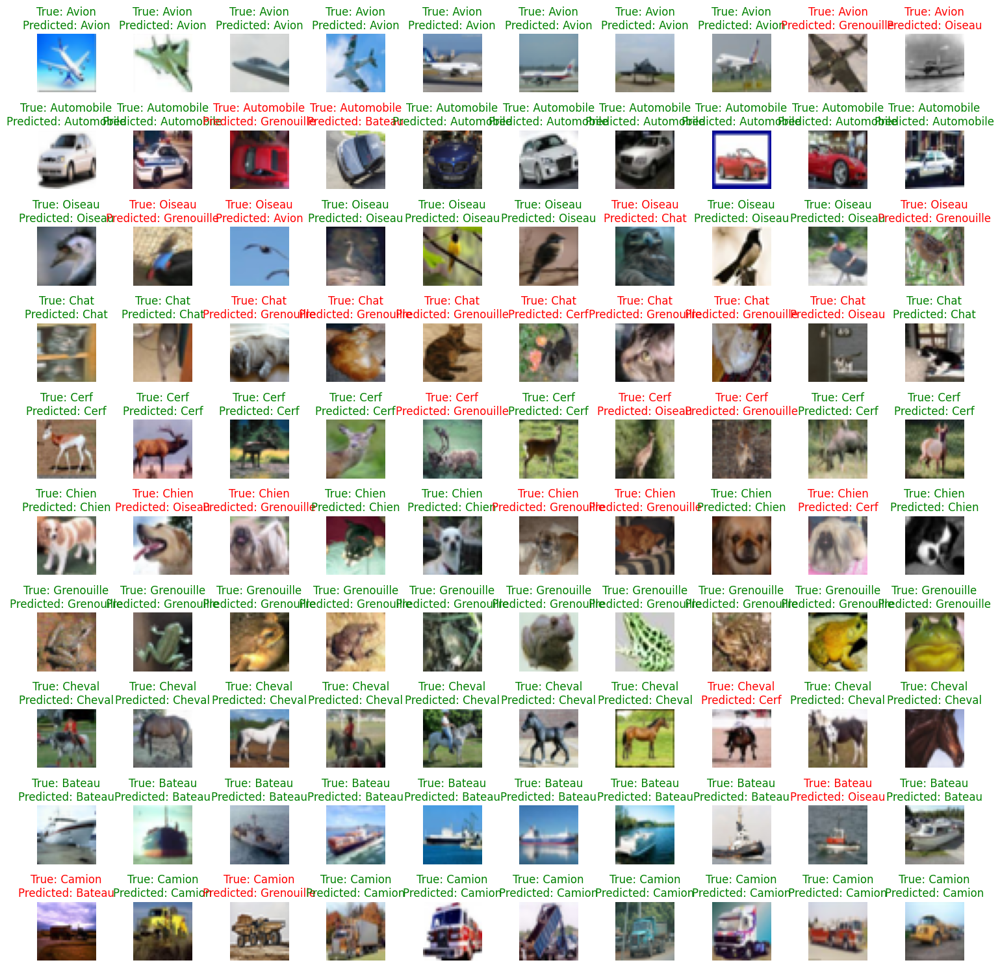

Nombre de bonnes prédictions : 73
Nombre de mauvaises prédictions : 27



Chargement du modèle : CNN simple.h5
313/313 [==============================] - 1s 3ms/step
Accuracy globale : 70.09%
              precision    recall  f1-score   support

       Avion       0.77      0.68      0.72      1000
  Automobile       0.84      0.81      0.82      1000
      Oiseau       0.62      0.57      0.59      1000
        Chat       0.47      0.56      0.51      1000
        Cerf       0.62      0.70      0.65      1000
       Chien       0.61      0.58      0.60      1000
  Grenouille       0.74      0.80      0.77      1000
      Cheval       0.82      0.68      0.74      1000
      Bateau       0.79      0.82      0.80      1000
      Camion       0.81      0.80      0.81      1000

    accuracy                           0.70     10000
   macro avg       0.71      0.70      0.70     10000
weighted avg       0.71      0.70      0.70     10000

Accuracy par classe :
Avion: 67.70%
Automobile: 8

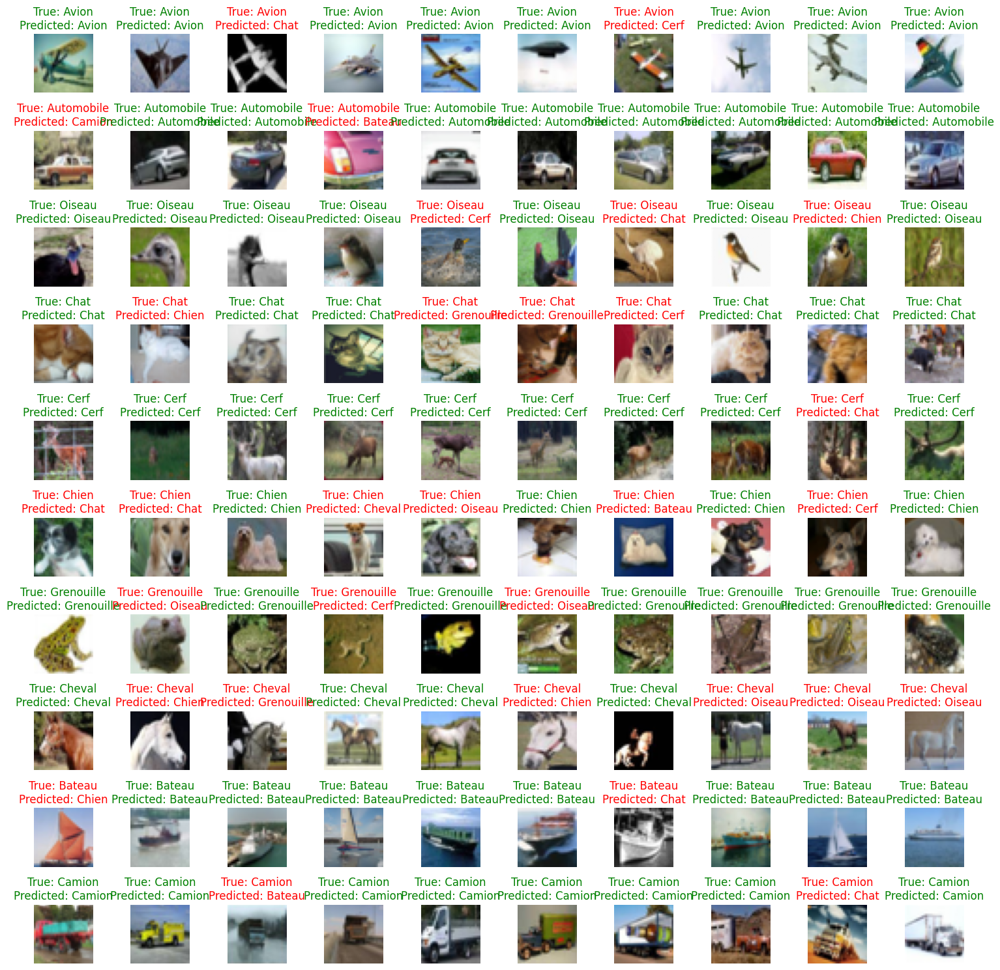

Nombre de bonnes prédictions : 69
Nombre de mauvaises prédictions : 31



Chargement du modèle : DenseNet121.h5
313/313 [==============================] - 11s 31ms/step
Accuracy globale : 82.35%
              precision    recall  f1-score   support

       Avion       0.84      0.84      0.84      1000
  Automobile       0.88      0.93      0.90      1000
      Oiseau       0.72      0.83      0.77      1000
        Chat       0.72      0.63      0.67      1000
        Cerf       0.81      0.76      0.79      1000
       Chien       0.77      0.74      0.75      1000
  Grenouille       0.88      0.86      0.87      1000
      Cheval       0.86      0.85      0.85      1000
      Bateau       0.87      0.92      0.90      1000
      Camion       0.88      0.88      0.88      1000

    accuracy                           0.82     10000
   macro avg       0.82      0.82      0.82     10000
weighted avg       0.82      0.82      0.82     10000

Accuracy par classe :
Avion: 83.60%
Automobile

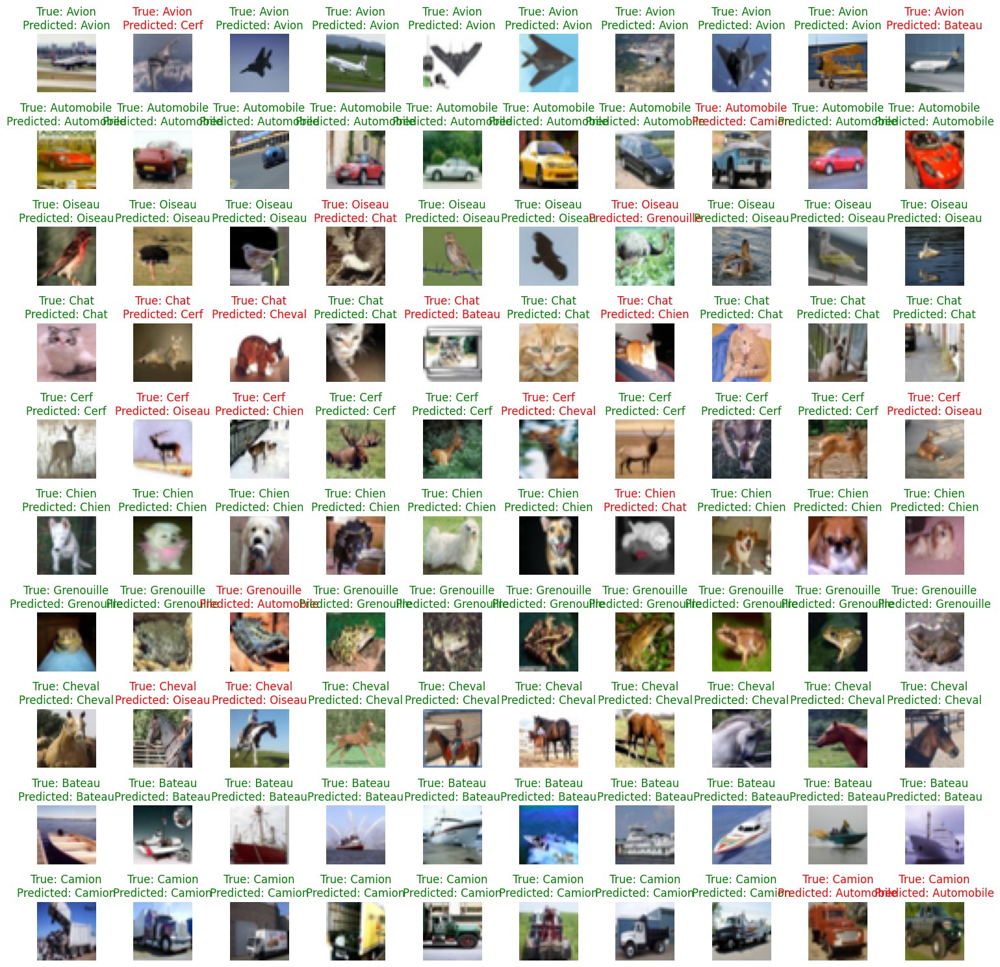

Nombre de bonnes prédictions : 81
Nombre de mauvaises prédictions : 19



Chargement du modèle : DenseNet201.h5
313/313 [==============================] - 18s 52ms/step
Accuracy globale : 82.61%
              precision    recall  f1-score   support

       Avion       0.79      0.90      0.84      1000
  Automobile       0.91      0.89      0.90      1000
      Oiseau       0.74      0.85      0.79      1000
        Chat       0.69      0.65      0.67      1000
        Cerf       0.87      0.76      0.81      1000
       Chien       0.78      0.74      0.76      1000
  Grenouille       0.84      0.88      0.86      1000
      Cheval       0.86      0.86      0.86      1000
      Bateau       0.93      0.86      0.89      1000
      Camion       0.89      0.87      0.88      1000

    accuracy                           0.83     10000
   macro avg       0.83      0.83      0.83     10000
weighted avg       0.83      0.83      0.83     10000

Accuracy par classe :
Avion: 90.00%
Automobile

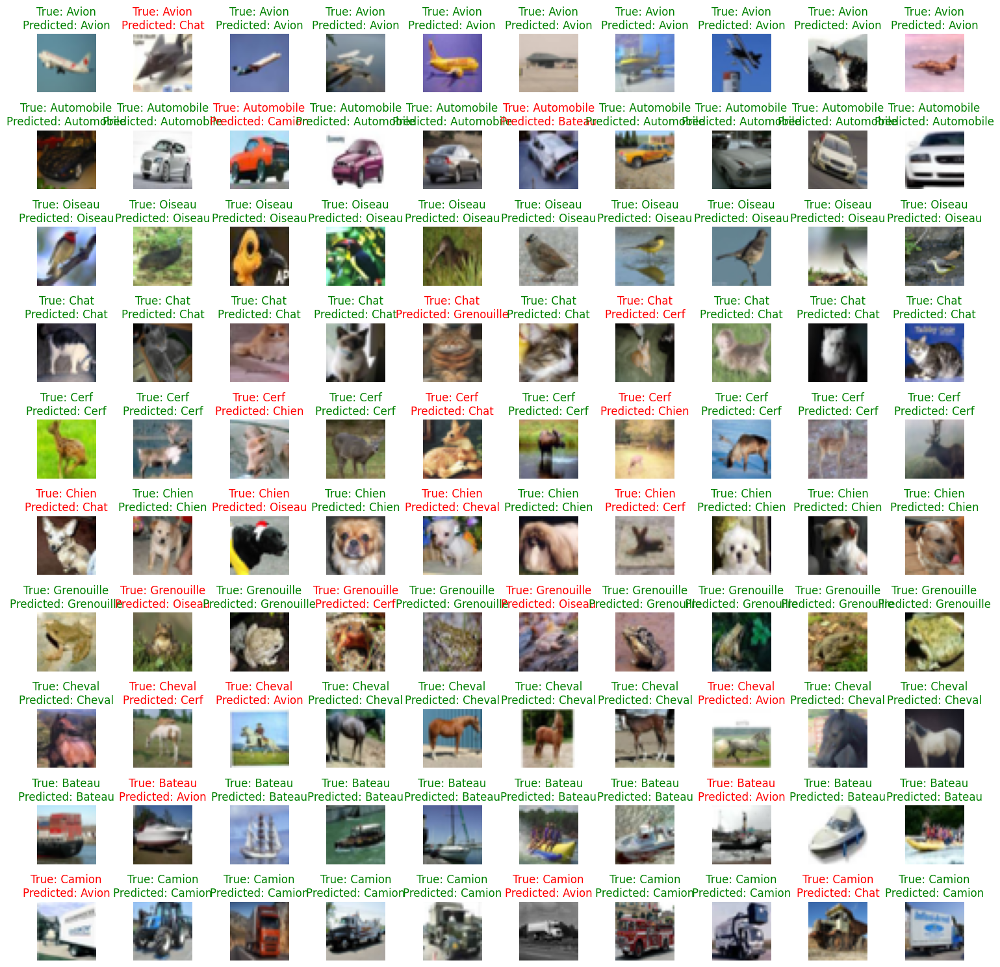

Nombre de bonnes prédictions : 77
Nombre de mauvaises prédictions : 23



Chargement du modèle : LeNet.h5
313/313 [==============================] - 0s 1ms/step
Accuracy globale : 59.07%
              precision    recall  f1-score   support

       Avion       0.53      0.76      0.63      1000
  Automobile       0.74      0.70      0.72      1000
      Oiseau       0.48      0.50      0.49      1000
        Chat       0.43      0.32      0.37      1000
        Cerf       0.57      0.49      0.53      1000
       Chien       0.49      0.48      0.49      1000
  Grenouille       0.62      0.73      0.67      1000
      Cheval       0.69      0.58      0.63      1000
      Bateau       0.67      0.74      0.70      1000
      Camion       0.71      0.60      0.65      1000

    accuracy                           0.59     10000
   macro avg       0.59      0.59      0.59     10000
weighted avg       0.59      0.59      0.59     10000

Accuracy par classe :
Avion: 76.30%
Automobile: 69.90%

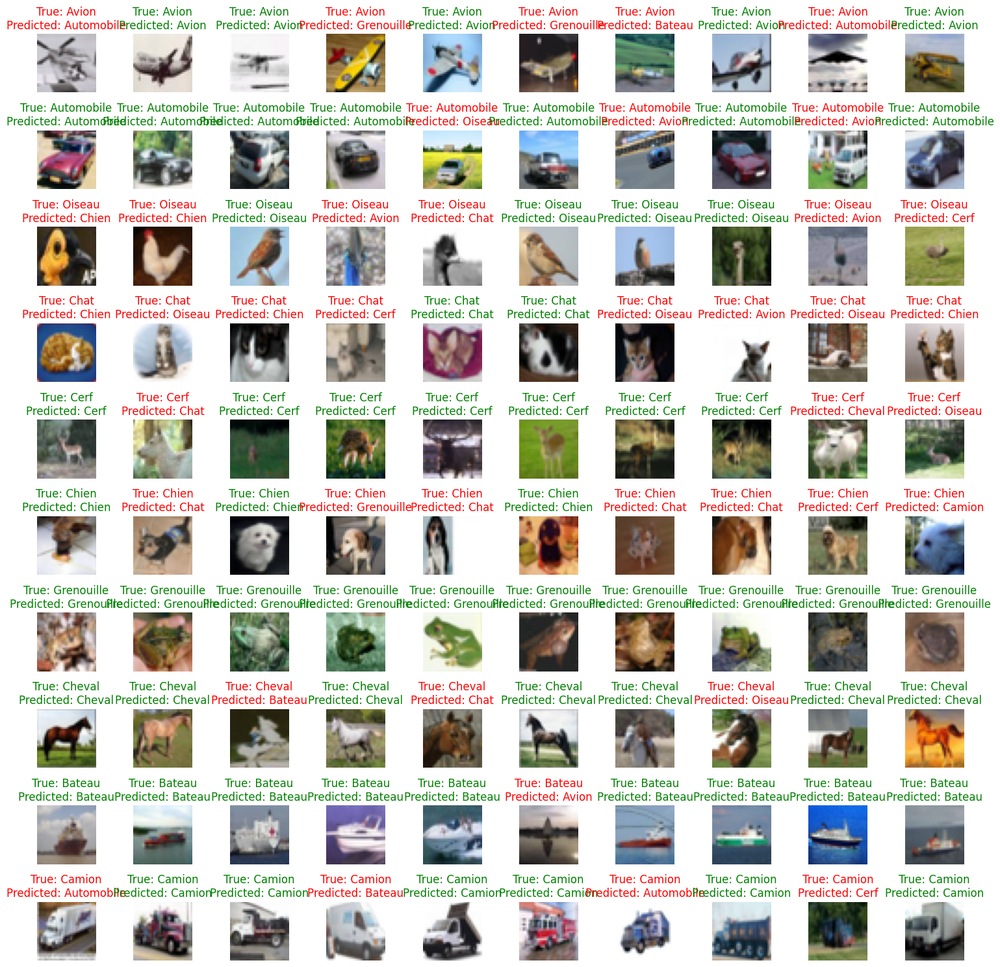

Nombre de bonnes prédictions : 60
Nombre de mauvaises prédictions : 40



Chargement du modèle : ResNet50.h5
313/313 [==============================] - 14s 44ms/step
Accuracy globale : 75.61%
              precision    recall  f1-score   support

       Avion       0.81      0.79      0.80      1000
  Automobile       0.89      0.77      0.82      1000
      Oiseau       0.72      0.71      0.72      1000
        Chat       0.60      0.56      0.58      1000
        Cerf       0.71      0.73      0.72      1000
       Chien       0.65      0.65      0.65      1000
  Grenouille       0.80      0.83      0.81      1000
      Cheval       0.78      0.82      0.80      1000
      Bateau       0.93      0.78      0.85      1000
      Camion       0.73      0.92      0.81      1000

    accuracy                           0.76     10000
   macro avg       0.76      0.76      0.76     10000
weighted avg       0.76      0.76      0.76     10000

Accuracy par classe :
Avion: 78.50%
Automobile: 7

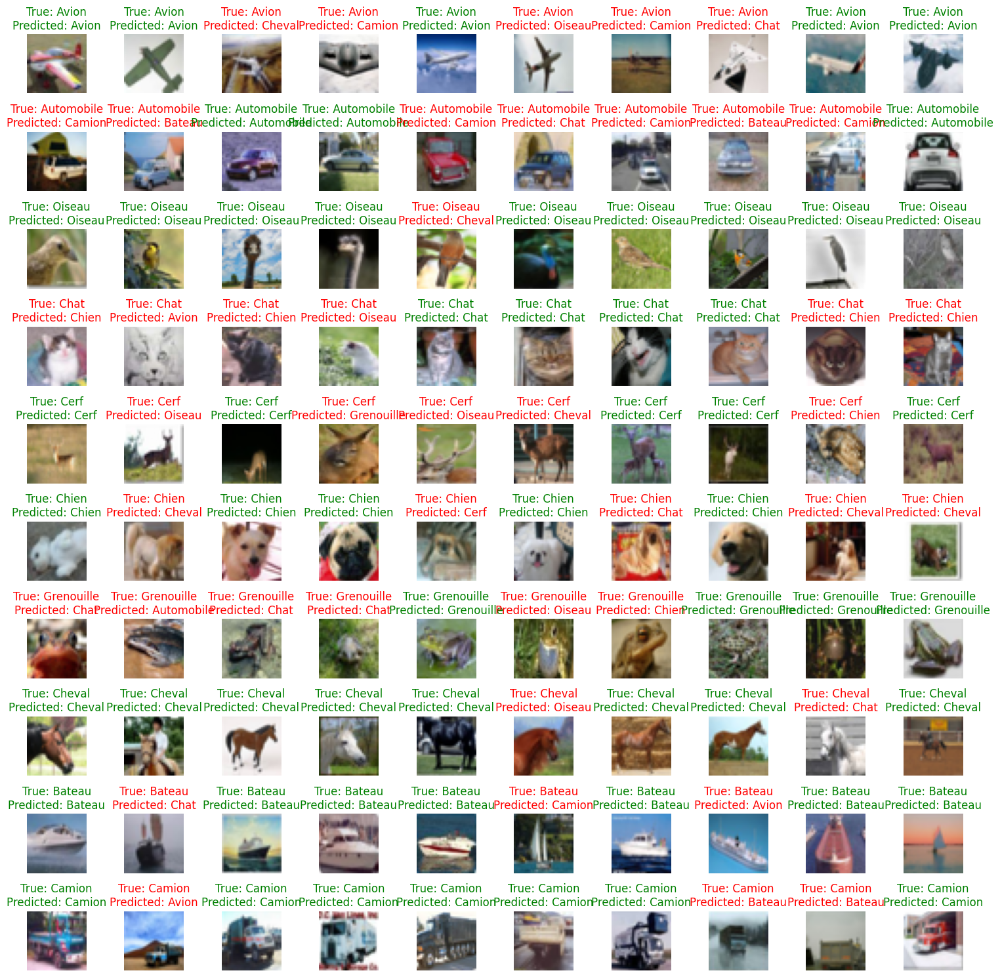

Nombre de bonnes prédictions : 57
Nombre de mauvaises prédictions : 43



Chargement du modèle : VGGNet.h5
313/313 [==============================] - 20s 62ms/step
Accuracy globale : 10.00%
              precision    recall  f1-score   support

       Avion       0.00      0.00      0.00      1000
  Automobile       0.00      0.00      0.00      1000
      Oiseau       0.10      1.00      0.18      1000
        Chat       0.00      0.00      0.00      1000
        Cerf       0.00      0.00      0.00      1000
       Chien       0.00      0.00      0.00      1000
  Grenouille       0.00      0.00      0.00      1000
      Cheval       0.00      0.00      0.00      1000
      Bateau       0.00      0.00      0.00      1000
      Camion       0.00      0.00      0.00      1000

    accuracy                           0.10     10000
   macro avg       0.01      0.10      0.02     10000
weighted avg       0.01      0.10      0.02     10000

Accuracy par classe :
Avion: 0.00%
Automobile: 0.00

c:\code\python\python39\lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\code\python\python39\lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\code\python\python39\lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


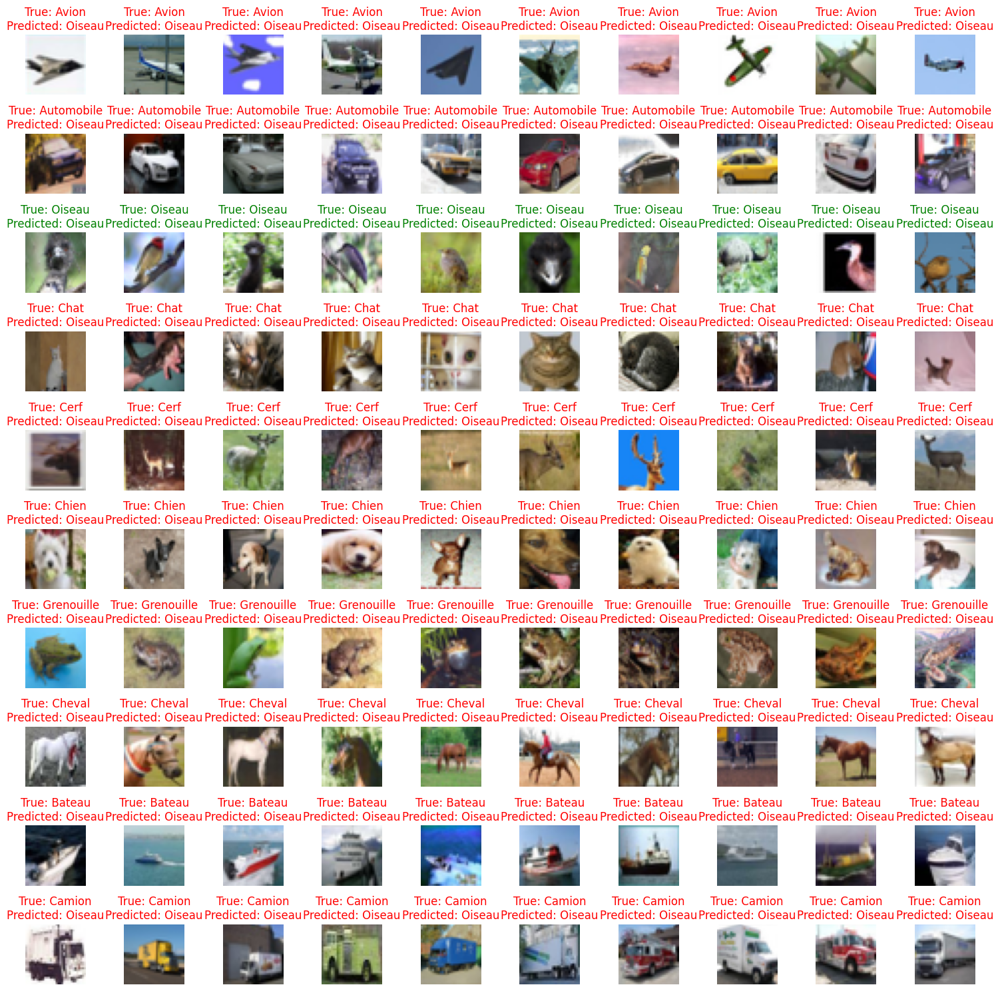

Nombre de bonnes prédictions : 10
Nombre de mauvaises prédictions : 90





In [29]:
# Chemin du dossier contenant les modèles sauvegardés
models_dir = '../models/cifar10/'

# Liste des fichiers dans le dossier
model_files = os.listdir(models_dir)

# Boucle pour charger chaque modèle et afficher des images aléatoires
for model_file in model_files:
    if model_file.endswith('.h5'):

        # Construire le chemin complet vers le modèle
        model_path = os.path.join(models_dir, model_file)

        # Imprimer le nom du modèle chargé
        print(f"Chargement du modèle : {model_file}")
        
        # Charger le modèle
        loaded_model = tf.keras.models.load_model(model_path)
        
        evaluate_model(x_test, y_test, loaded_model, class_names)

        # Afficher des images aléatoires avec des prédictions pour ce modèle
        display_random_images_with_predictions(x_test, y_test, class_names, loaded_model)
        print('\n\n')
